## <center> Cleaning and Evaluating NYC Wifi Hotspots Dataset 

## <center> Not Final Version

In [765]:
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
import plotly.express as px

In [766]:
df_wifi = pd.read_csv("NYC_Wi-Fi_Hotspot_Locations.csv")

In [1006]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
#to see the full table

In [1007]:
df_wifi

,Borough,Type,Provider,Name,Location,Latitude,Longitude,Location_T,Remarks,City,SSID,SourceID,Activated,Borough_Name,Neighborhood Tabulation Area Code (NTACODE),Neighborhoods,Council_District,Postcode,BoroCD,"Location (Lat, Long)",Community_Districts
0,4,Limited Free,SPECTRUM,Baisley Pond Park,Park Perimeter,40.674860,-73.784120,Outdoor TWC Aerial,3 free 10 min sessions,Queens,GuestWiFi,0,09/09/9999,Queens,QN02,Springfield Gardens North,28,11434,412,"(40.6748599999, -73.7841200005)",41.0
1,4,Limited Free,SPECTRUM,Kissena Park,Park Perimeter,40.747560,-73.818150,Outdoor TWC Aerial,3 free 10 min sessions,Queens,GuestWiFi,0,09/09/9999,Queens,QN22,Flushing,20,11355,407,"(40.7475599996, -73.8181499997)",22.0
2,3,Free,Transit Wireless,Grand St (L),Grand St (L),40.711926,-73.940670,Subway Station,SN 123,Brooklyn,TransitWirelessWiFi,NaN,09/09/9999,Brooklyn,BK90,East Williamsburg,34,11206,301,"(40.7119259997, -73.9406699994)",36.0
3,3,Free,Downtown Brooklyn,NaN,125 Court St.,40.689985,-73.991995,Outdoor,NaN,Brooklyn,Downtown Brooklyn WiFi,NaN,09/09/9999,Brooklyn,BK09,Brooklyn Heights-Cobble Hill,33,11201,302,"(40.6899850001, -73.9919950004)",68.0
4,1,Free,Transit Wireless,Lexington Av-63 St (F),Lexington Av-63 St (F),40.764630,-73.966115,Subway Station,SN 223,New York,TransitWirelessWiFi,NaN,09/09/9999,Manhattan,MN40,Upper East Side-Carnegie Hill,4,10065,108,"(40.7646300002, -73.9661150001)",23.0
5,4,Limited Free,SPECTRUM,Kissena Park,Park Perimeter,40.742430,-73.811510,Outdoor TWC Aerial,3 free 10 min sessions,Queens,GuestWiFi,0,09/09/9999,Queens,QN62,Queensboro Hill,20,11355,407,"(40.7424300003, -73.8115100003)",22.0
6,1,Free,Harlem,NaN,Pole 94 - LenWS1N133,40.812944,-73.941693,Outdoor,NaN,New York,Harlem Wi-Fi,NaN,09/09/9999,Manhattan,MN03,Central Harlem North-Polo Grounds,9,10037,110,"(40.812944, -73.9416929996)",18.0
7,3,Free,BPL,Clinton Hill - Brooklyn Public Library,380 WASHINGTON AVENUE,40.687379,-73.966031,Library,NaN,Brooklyn,BPLUNWIRED,NaN,09/09/9999,Brooklyn,BK69,Clinton Hill,35,11238,302,"(40.6873790941, -73.966030666)",68.0
8,4,Free,Transit Wireless,Halsey St (L),Halsey St (L),40.695602,-73.904084,Subway Station,SN 129,Brooklyn,TransitWirelessWiFi,NaN,09/09/9999,Queens,QN20,Ridgewood,34,11385,405,"(40.6956020001, -73.9040840004)",54.0
9,3,Free,Transit Wireless,"Broadway Junction (A,C,J,L,Z)","Broadway Junction (A,C,J,L,Z)",40.678334,-73.905316,Subway Station,SN 184,Brooklyn,TransitWirelessWiFi,NaN,09/09/9999,Brooklyn,BK79,Ocean Hill,37,11233,316,"(40.6783340002, -73.9053160001)",55.0


In [768]:
df_wifi.describe()

,OBJECTID,Borough,Latitude,Longitude,X,Y,BoroCode,Council Distrcit,Postcode,BoroCD,Census Tract,BCTCB2010,BIN,BBL,DOITT_ID,Zip Codes,Community Districts,Borough Boundaries,City Council Districts,Police Precincts
count,3319.000000,3319.000000,3319.000000,3319.000000,3.319000e+03,3319.000000,3319.000000,3319.000000,3319.000000,3319.000000,3319.000000,3319.000000,3.319000e+03,3.319000e+03,3319.000000,3266.000000,3318.000000,3318.000000,3318.000000,3318.000000
mean,11279.197349,2.117505,40.741789,-73.950112,9.980701e+05,209540.439778,2.117505,17.210003,10535.245556,218.880988,2353.715276,2353.715276,1.581973e+06,1.751089e+09,2679.822537,13914.657379,36.732670,3.422845,29.733273,31.400241
std,967.314772,1.269830,0.066799,0.062109,1.722035e+04,24334.633844,1.269830,14.845808,583.464313,128.098784,12476.228592,12476.228592,1.453220e+06,1.415620e+09,1598.918823,3223.925609,21.766042,1.018631,15.104529,23.896045
min,9601.000000,1.000000,40.509531,-74.244107,9.163706e+05,125007.163094,1.000000,1.000000,10001.000000,101.000000,1.000000,1.000000,0.000000e+00,0.000000e+00,1.000000,10090.000000,1.000000,1.000000,1.000000,1.000000
25%,10445.500000,1.000000,40.695480,-73.985788,9.881911e+05,192679.650451,1.000000,4.000000,10022.000000,106.000000,76.000000,76.000000,0.000000e+00,1.007220e+09,1099.500000,12074.000000,18.000000,3.000000,18.000000,10.000000
50%,11286.000000,1.000000,40.745906,-73.962685,9.945985e+05,211036.902451,1.000000,9.000000,10075.000000,112.000000,163.000000,163.000000,1.056626e+06,1.017260e+09,3265.000000,12424.000000,37.000000,4.000000,32.000000,22.000000
75%,12116.500000,3.000000,40.791719,-73.926875,1.004498e+06,227723.332824,3.000000,32.000000,11211.000000,309.000000,271.000000,271.000000,3.018582e+06,3.013530e+09,4094.500000,16858.000000,56.000000,4.000000,41.000000,54.000000
max,12946.000000,5.000000,40.903723,-73.714838,1.063266e+06,268543.647017,5.000000,51.000000,11694.000000,595.000000,157902.000000,157902.000000,5.162377e+06,5.078990e+09,4950.000000,24671.000000,71.000000,5.000000,51.000000,77.000000


In [769]:
df_wifi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3319 entries, 0 to 3318
Data columns (total 34 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   OBJECTID                                     3319 non-null   int64  
 1   Borough                                      3319 non-null   int64  
 2   Type                                         3319 non-null   object 
 3   Provider                                     3319 non-null   object 
 4   Name                                         3089 non-null   object 
 5   Location                                     3319 non-null   object 
 6   Latitude                                     3319 non-null   float64
 7   Longitude                                    3319 non-null   float64
 8   X                                            3319 non-null   float64
 9   Y                                            3319 non-null   float64
 10  

In [770]:
df_wifi.Provider.unique()  

array(['SPECTRUM', 'Transit Wireless', 'Downtown Brooklyn', 'Harlem',
       'BPL', 'ALTICEUSA', 'Fiberless', 'LinkNYC - Citybridge',
       'Manhattan Down Alliance', 'AT&T', 'NYPL', 'NYCHA', 'Chelsea',
       'QPL', 'City Tech', 'Spot On Networks', 'Partner'], dtype=object)

In [771]:
df_wifi.Provider.value_counts()

LinkNYC - Citybridge       1868
SPECTRUM                    343
Transit Wireless            276
ALTICEUSA                   237
Harlem                      101
Downtown Brooklyn           100
NYPL                         90
QPL                          65
BPL                          59
Manhattan Down Alliance      36
Chelsea                      30
Fiberless                    30
NYCHA                        28
AT&T                         27
Spot On Networks             16
City Tech                    11
Partner                       2
Name: Provider, dtype: int64

In [772]:
df_wifi.Borough.value_counts()

1    1672
3     700
4     531
2     316
5     100
Name: Borough, dtype: int64

In [773]:
df_wifi.Postcode.value_counts()

11201    156
10011    110
10025    106
10016     96
10027     89
        ... 
10308      1
11422      1
10282      1
11417      1
10474      1
Name: Postcode, Length: 172, dtype: int64

#### <center> Renaming

In [774]:
df_wifi = df_wifi.rename(columns={'Zip Codes': 'Zip_Codes'})

In [1008]:
df_wifi

,Borough,Type,Provider,Name,Location,Latitude,Longitude,Location_T,Remarks,City,SSID,SourceID,Activated,Borough_Name,Neighborhood Tabulation Area Code (NTACODE),Neighborhoods,Council_District,Postcode,BoroCD,"Location (Lat, Long)",Community_Districts
0,4,Limited Free,SPECTRUM,Baisley Pond Park,Park Perimeter,40.674860,-73.784120,Outdoor TWC Aerial,3 free 10 min sessions,Queens,GuestWiFi,0,09/09/9999,Queens,QN02,Springfield Gardens North,28,11434,412,"(40.6748599999, -73.7841200005)",41.0
1,4,Limited Free,SPECTRUM,Kissena Park,Park Perimeter,40.747560,-73.818150,Outdoor TWC Aerial,3 free 10 min sessions,Queens,GuestWiFi,0,09/09/9999,Queens,QN22,Flushing,20,11355,407,"(40.7475599996, -73.8181499997)",22.0
2,3,Free,Transit Wireless,Grand St (L),Grand St (L),40.711926,-73.940670,Subway Station,SN 123,Brooklyn,TransitWirelessWiFi,NaN,09/09/9999,Brooklyn,BK90,East Williamsburg,34,11206,301,"(40.7119259997, -73.9406699994)",36.0
3,3,Free,Downtown Brooklyn,NaN,125 Court St.,40.689985,-73.991995,Outdoor,NaN,Brooklyn,Downtown Brooklyn WiFi,NaN,09/09/9999,Brooklyn,BK09,Brooklyn Heights-Cobble Hill,33,11201,302,"(40.6899850001, -73.9919950004)",68.0
4,1,Free,Transit Wireless,Lexington Av-63 St (F),Lexington Av-63 St (F),40.764630,-73.966115,Subway Station,SN 223,New York,TransitWirelessWiFi,NaN,09/09/9999,Manhattan,MN40,Upper East Side-Carnegie Hill,4,10065,108,"(40.7646300002, -73.9661150001)",23.0
5,4,Limited Free,SPECTRUM,Kissena Park,Park Perimeter,40.742430,-73.811510,Outdoor TWC Aerial,3 free 10 min sessions,Queens,GuestWiFi,0,09/09/9999,Queens,QN62,Queensboro Hill,20,11355,407,"(40.7424300003, -73.8115100003)",22.0
6,1,Free,Harlem,NaN,Pole 94 - LenWS1N133,40.812944,-73.941693,Outdoor,NaN,New York,Harlem Wi-Fi,NaN,09/09/9999,Manhattan,MN03,Central Harlem North-Polo Grounds,9,10037,110,"(40.812944, -73.9416929996)",18.0
7,3,Free,BPL,Clinton Hill - Brooklyn Public Library,380 WASHINGTON AVENUE,40.687379,-73.966031,Library,NaN,Brooklyn,BPLUNWIRED,NaN,09/09/9999,Brooklyn,BK69,Clinton Hill,35,11238,302,"(40.6873790941, -73.966030666)",68.0
8,4,Free,Transit Wireless,Halsey St (L),Halsey St (L),40.695602,-73.904084,Subway Station,SN 129,Brooklyn,TransitWirelessWiFi,NaN,09/09/9999,Queens,QN20,Ridgewood,34,11385,405,"(40.6956020001, -73.9040840004)",54.0
9,3,Free,Transit Wireless,"Broadway Junction (A,C,J,L,Z)","Broadway Junction (A,C,J,L,Z)",40.678334,-73.905316,Subway Station,SN 184,Brooklyn,TransitWirelessWiFi,NaN,09/09/9999,Brooklyn,BK79,Ocean Hill,37,11233,316,"(40.6783340002, -73.9053160001)",55.0


In [776]:
df_wifi = df_wifi.rename(columns={'Community Districts': 'Community_Districts', 'Police Precincts': 'Police_Precincts', 'City Council Districts': 'City_Council_Districts','Borough Boundaries': 'Borough_Boundaries', 'Borough Name': 'Borough_Name', 'Council Distrcit': 'Council_District', 'Neighborhood Tabulation Area (NTA)': 'Neighborhoods'  })

In [1009]:
df_wifi


,Borough,Type,Provider,Name,Location,Latitude,Longitude,Location_T,Remarks,City,SSID,SourceID,Activated,Borough_Name,Neighborhood Tabulation Area Code (NTACODE),Neighborhoods,Council_District,Postcode,BoroCD,"Location (Lat, Long)",Community_Districts
0,4,Limited Free,SPECTRUM,Baisley Pond Park,Park Perimeter,40.674860,-73.784120,Outdoor TWC Aerial,3 free 10 min sessions,Queens,GuestWiFi,0,09/09/9999,Queens,QN02,Springfield Gardens North,28,11434,412,"(40.6748599999, -73.7841200005)",41.0
1,4,Limited Free,SPECTRUM,Kissena Park,Park Perimeter,40.747560,-73.818150,Outdoor TWC Aerial,3 free 10 min sessions,Queens,GuestWiFi,0,09/09/9999,Queens,QN22,Flushing,20,11355,407,"(40.7475599996, -73.8181499997)",22.0
2,3,Free,Transit Wireless,Grand St (L),Grand St (L),40.711926,-73.940670,Subway Station,SN 123,Brooklyn,TransitWirelessWiFi,NaN,09/09/9999,Brooklyn,BK90,East Williamsburg,34,11206,301,"(40.7119259997, -73.9406699994)",36.0
3,3,Free,Downtown Brooklyn,NaN,125 Court St.,40.689985,-73.991995,Outdoor,NaN,Brooklyn,Downtown Brooklyn WiFi,NaN,09/09/9999,Brooklyn,BK09,Brooklyn Heights-Cobble Hill,33,11201,302,"(40.6899850001, -73.9919950004)",68.0
4,1,Free,Transit Wireless,Lexington Av-63 St (F),Lexington Av-63 St (F),40.764630,-73.966115,Subway Station,SN 223,New York,TransitWirelessWiFi,NaN,09/09/9999,Manhattan,MN40,Upper East Side-Carnegie Hill,4,10065,108,"(40.7646300002, -73.9661150001)",23.0
5,4,Limited Free,SPECTRUM,Kissena Park,Park Perimeter,40.742430,-73.811510,Outdoor TWC Aerial,3 free 10 min sessions,Queens,GuestWiFi,0,09/09/9999,Queens,QN62,Queensboro Hill,20,11355,407,"(40.7424300003, -73.8115100003)",22.0
6,1,Free,Harlem,NaN,Pole 94 - LenWS1N133,40.812944,-73.941693,Outdoor,NaN,New York,Harlem Wi-Fi,NaN,09/09/9999,Manhattan,MN03,Central Harlem North-Polo Grounds,9,10037,110,"(40.812944, -73.9416929996)",18.0
7,3,Free,BPL,Clinton Hill - Brooklyn Public Library,380 WASHINGTON AVENUE,40.687379,-73.966031,Library,NaN,Brooklyn,BPLUNWIRED,NaN,09/09/9999,Brooklyn,BK69,Clinton Hill,35,11238,302,"(40.6873790941, -73.966030666)",68.0
8,4,Free,Transit Wireless,Halsey St (L),Halsey St (L),40.695602,-73.904084,Subway Station,SN 129,Brooklyn,TransitWirelessWiFi,NaN,09/09/9999,Queens,QN20,Ridgewood,34,11385,405,"(40.6956020001, -73.9040840004)",54.0
9,3,Free,Transit Wireless,"Broadway Junction (A,C,J,L,Z)","Broadway Junction (A,C,J,L,Z)",40.678334,-73.905316,Subway Station,SN 184,Brooklyn,TransitWirelessWiFi,NaN,09/09/9999,Brooklyn,BK79,Ocean Hill,37,11233,316,"(40.6783340002, -73.9053160001)",55.0


## drop columns that I wont use 

In [778]:
df_wifi_slim = df_wifi.drop([ 'X' , 'Y', 'BIN','BBL','BCTCB2010', 'DOITT_ID', 'Zip_Codes','BoroCode', 'Police_Precincts', 'Borough_Boundaries', 'OBJECTID' , 'Census Tract', 'City_Council_Districts'], axis=1, inplace=True)

In [779]:
df_wifi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3319 entries, 0 to 3318
Data columns (total 21 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   Borough                                      3319 non-null   int64  
 1   Type                                         3319 non-null   object 
 2   Provider                                     3319 non-null   object 
 3   Name                                         3089 non-null   object 
 4   Location                                     3319 non-null   object 
 5   Latitude                                     3319 non-null   float64
 6   Longitude                                    3319 non-null   float64
 7   Location_T                                   3319 non-null   object 
 8   Remarks                                      2771 non-null   object 
 9   City                                         3319 non-null   object 
 10  

In [780]:
df_wifi_slimer = df_wifi.drop([ 'OBJECTID' , 'Census Tract', 'Activated', 'BoroCD'], axis=1, inplace=True)

KeyError: "['OBJECTID', 'Census Tract'] not found in axis"

In [781]:
df_wifi

,Borough,Type,Provider,Name,Location,Latitude,Longitude,Location_T,Remarks,City,...,SourceID,Activated,Borough_Name,Neighborhood Tabulation Area Code (NTACODE),Neighborhoods,Council_District,Postcode,BoroCD,"Location (Lat, Long)",Community_Districts
0,4,Limited Free,SPECTRUM,Baisley Pond Park,Park Perimeter,40.674860,-73.784120,Outdoor TWC Aerial,3 free 10 min sessions,Queens,...,0,09/09/9999,Queens,QN02,Springfield Gardens North,28,11434,412,"(40.6748599999, -73.7841200005)",41.0
1,4,Limited Free,SPECTRUM,Kissena Park,Park Perimeter,40.747560,-73.818150,Outdoor TWC Aerial,3 free 10 min sessions,Queens,...,0,09/09/9999,Queens,QN22,Flushing,20,11355,407,"(40.7475599996, -73.8181499997)",22.0
2,3,Free,Transit Wireless,Grand St (L),Grand St (L),40.711926,-73.940670,Subway Station,SN 123,Brooklyn,...,NaN,09/09/9999,Brooklyn,BK90,East Williamsburg,34,11206,301,"(40.7119259997, -73.9406699994)",36.0
3,3,Free,Downtown Brooklyn,NaN,125 Court St.,40.689985,-73.991995,Outdoor,NaN,Brooklyn,...,NaN,09/09/9999,Brooklyn,BK09,Brooklyn Heights-Cobble Hill,33,11201,302,"(40.6899850001, -73.9919950004)",68.0
4,1,Free,Transit Wireless,Lexington Av-63 St (F),Lexington Av-63 St (F),40.764630,-73.966115,Subway Station,SN 223,New York,...,NaN,09/09/9999,Manhattan,MN40,Upper East Side-Carnegie Hill,4,10065,108,"(40.7646300002, -73.9661150001)",23.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3314,3,Limited Free,SPECTRUM,Carroll Park,Court off Smith St between Carrol St and 1st P...,40.680630,-73.995382,Outdoor TWC Aerial,3 free 10 min sessions,Brooklyn,...,0,09/09/9999,Brooklyn,BK33,Carroll Gardens-Columbia Street-Red Hook,39,11231,306,"(40.6806299998, -73.9953819995)",14.0
3315,2,Free,LinkNYC - Citybridge,bx-01-138789,312 WILLIS AVENUE,40.810896,-73.921434,Outdoor Kiosk,"Tablet Internet -phone , Free 1 GB Wi-FI Service",Bronx,...,LINK-012132,04/20/2018,Bronx,BX39,Mott Haven-Port Morris,8,10454,201,"(40.8108964904, -73.9214341701)",49.0
3316,3,Free,LinkNYC - Citybridge,bk-01-143982,32 GRAHAM AVENUE,40.701930,-73.942239,Outdoor Kiosk,"Tablet Internet -phone , Free 1 GB Wi-FI Service",Brooklyn,...,LINK-000004,08/02/2017,Brooklyn,BK90,East Williamsburg,34,11206,301,"(40.7019303441, -73.9422392381)",36.0
3317,3,Free,LinkNYC - Citybridge,bk-17-126527,1339 FLATBUSH AVENUE,40.638560,-73.953603,Outdoor Kiosk,"Tablet Internet -phone , Free 1 GB Wi-FI Service",Brooklyn,...,LINK-000022,05/11/2018,Brooklyn,BK95,Erasmus,45,11226,317,"(40.6385596088, -73.9536032378)",61.0


## Research: 

##### In the U.S. State of New York, there are a total of 1,752 zip codes. 
##### In New York City, the zip codes are divided into each borough:

##### Manhattan: 10001-10282
##### Staten Island: 10301-10314
##### Bronx: 10451-10475
##### Queens: 11004-11109, 11351-11697
##### Brooklyn: 11201-11256
    
   #####  https://bklyndesigns.com/new-york-city-zip-code/

### Must drop any zip code lower than 10001 and higher than 11697 

In [782]:
condition =(df_wifi['Postcode'] < 10001) | (df_wifi['Postcode'] > 11697) # this step came from my first attempt evaluating the data and finding zipcodes outside of nyc. I ran this again, and it results in no loss of rows using the Postcode column and not the ZipCode column. 

In [783]:
index_to_drop = df_wifi[condition].index

In [784]:
df_onlynycwifi = df_wifi.drop(index_to_drop)

In [785]:
df_onlynycwifi

,Borough,Type,Provider,Name,Location,Latitude,Longitude,Location_T,Remarks,City,...,SourceID,Activated,Borough_Name,Neighborhood Tabulation Area Code (NTACODE),Neighborhoods,Council_District,Postcode,BoroCD,"Location (Lat, Long)",Community_Districts
0,4,Limited Free,SPECTRUM,Baisley Pond Park,Park Perimeter,40.674860,-73.784120,Outdoor TWC Aerial,3 free 10 min sessions,Queens,...,0,09/09/9999,Queens,QN02,Springfield Gardens North,28,11434,412,"(40.6748599999, -73.7841200005)",41.0
1,4,Limited Free,SPECTRUM,Kissena Park,Park Perimeter,40.747560,-73.818150,Outdoor TWC Aerial,3 free 10 min sessions,Queens,...,0,09/09/9999,Queens,QN22,Flushing,20,11355,407,"(40.7475599996, -73.8181499997)",22.0
2,3,Free,Transit Wireless,Grand St (L),Grand St (L),40.711926,-73.940670,Subway Station,SN 123,Brooklyn,...,NaN,09/09/9999,Brooklyn,BK90,East Williamsburg,34,11206,301,"(40.7119259997, -73.9406699994)",36.0
3,3,Free,Downtown Brooklyn,NaN,125 Court St.,40.689985,-73.991995,Outdoor,NaN,Brooklyn,...,NaN,09/09/9999,Brooklyn,BK09,Brooklyn Heights-Cobble Hill,33,11201,302,"(40.6899850001, -73.9919950004)",68.0
4,1,Free,Transit Wireless,Lexington Av-63 St (F),Lexington Av-63 St (F),40.764630,-73.966115,Subway Station,SN 223,New York,...,NaN,09/09/9999,Manhattan,MN40,Upper East Side-Carnegie Hill,4,10065,108,"(40.7646300002, -73.9661150001)",23.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3314,3,Limited Free,SPECTRUM,Carroll Park,Court off Smith St between Carrol St and 1st P...,40.680630,-73.995382,Outdoor TWC Aerial,3 free 10 min sessions,Brooklyn,...,0,09/09/9999,Brooklyn,BK33,Carroll Gardens-Columbia Street-Red Hook,39,11231,306,"(40.6806299998, -73.9953819995)",14.0
3315,2,Free,LinkNYC - Citybridge,bx-01-138789,312 WILLIS AVENUE,40.810896,-73.921434,Outdoor Kiosk,"Tablet Internet -phone , Free 1 GB Wi-FI Service",Bronx,...,LINK-012132,04/20/2018,Bronx,BX39,Mott Haven-Port Morris,8,10454,201,"(40.8108964904, -73.9214341701)",49.0
3316,3,Free,LinkNYC - Citybridge,bk-01-143982,32 GRAHAM AVENUE,40.701930,-73.942239,Outdoor Kiosk,"Tablet Internet -phone , Free 1 GB Wi-FI Service",Brooklyn,...,LINK-000004,08/02/2017,Brooklyn,BK90,East Williamsburg,34,11206,301,"(40.7019303441, -73.9422392381)",36.0
3317,3,Free,LinkNYC - Citybridge,bk-17-126527,1339 FLATBUSH AVENUE,40.638560,-73.953603,Outdoor Kiosk,"Tablet Internet -phone , Free 1 GB Wi-FI Service",Brooklyn,...,LINK-000022,05/11/2018,Brooklyn,BK95,Erasmus,45,11226,317,"(40.6385596088, -73.9536032378)",61.0


In [786]:
df_onlynycwifi.describe()

,Borough,Latitude,Longitude,Council_District,Postcode,BoroCD,Community_Districts
count,3319.000000,3319.000000,3319.000000,3319.000000,3319.000000,3319.000000,3318.000000
mean,2.117505,40.741789,-73.950112,17.210003,10535.245556,218.880988,36.732670
std,1.269830,0.066799,0.062109,14.845808,583.464313,128.098784,21.766042
min,1.000000,40.509531,-74.244107,1.000000,10001.000000,101.000000,1.000000
25%,1.000000,40.695480,-73.985788,4.000000,10022.000000,106.000000,18.000000
50%,1.000000,40.745906,-73.962685,9.000000,10075.000000,112.000000,37.000000
75%,3.000000,40.791719,-73.926875,32.000000,11211.000000,309.000000,56.000000
max,5.000000,40.903723,-73.714838,51.000000,11694.000000,595.000000,71.000000


In [787]:
df_onlynycwifi

,Borough,Type,Provider,Name,Location,Latitude,Longitude,Location_T,Remarks,City,...,SourceID,Activated,Borough_Name,Neighborhood Tabulation Area Code (NTACODE),Neighborhoods,Council_District,Postcode,BoroCD,"Location (Lat, Long)",Community_Districts
0,4,Limited Free,SPECTRUM,Baisley Pond Park,Park Perimeter,40.674860,-73.784120,Outdoor TWC Aerial,3 free 10 min sessions,Queens,...,0,09/09/9999,Queens,QN02,Springfield Gardens North,28,11434,412,"(40.6748599999, -73.7841200005)",41.0
1,4,Limited Free,SPECTRUM,Kissena Park,Park Perimeter,40.747560,-73.818150,Outdoor TWC Aerial,3 free 10 min sessions,Queens,...,0,09/09/9999,Queens,QN22,Flushing,20,11355,407,"(40.7475599996, -73.8181499997)",22.0
2,3,Free,Transit Wireless,Grand St (L),Grand St (L),40.711926,-73.940670,Subway Station,SN 123,Brooklyn,...,NaN,09/09/9999,Brooklyn,BK90,East Williamsburg,34,11206,301,"(40.7119259997, -73.9406699994)",36.0
3,3,Free,Downtown Brooklyn,NaN,125 Court St.,40.689985,-73.991995,Outdoor,NaN,Brooklyn,...,NaN,09/09/9999,Brooklyn,BK09,Brooklyn Heights-Cobble Hill,33,11201,302,"(40.6899850001, -73.9919950004)",68.0
4,1,Free,Transit Wireless,Lexington Av-63 St (F),Lexington Av-63 St (F),40.764630,-73.966115,Subway Station,SN 223,New York,...,NaN,09/09/9999,Manhattan,MN40,Upper East Side-Carnegie Hill,4,10065,108,"(40.7646300002, -73.9661150001)",23.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3314,3,Limited Free,SPECTRUM,Carroll Park,Court off Smith St between Carrol St and 1st P...,40.680630,-73.995382,Outdoor TWC Aerial,3 free 10 min sessions,Brooklyn,...,0,09/09/9999,Brooklyn,BK33,Carroll Gardens-Columbia Street-Red Hook,39,11231,306,"(40.6806299998, -73.9953819995)",14.0
3315,2,Free,LinkNYC - Citybridge,bx-01-138789,312 WILLIS AVENUE,40.810896,-73.921434,Outdoor Kiosk,"Tablet Internet -phone , Free 1 GB Wi-FI Service",Bronx,...,LINK-012132,04/20/2018,Bronx,BX39,Mott Haven-Port Morris,8,10454,201,"(40.8108964904, -73.9214341701)",49.0
3316,3,Free,LinkNYC - Citybridge,bk-01-143982,32 GRAHAM AVENUE,40.701930,-73.942239,Outdoor Kiosk,"Tablet Internet -phone , Free 1 GB Wi-FI Service",Brooklyn,...,LINK-000004,08/02/2017,Brooklyn,BK90,East Williamsburg,34,11206,301,"(40.7019303441, -73.9422392381)",36.0
3317,3,Free,LinkNYC - Citybridge,bk-17-126527,1339 FLATBUSH AVENUE,40.638560,-73.953603,Outdoor Kiosk,"Tablet Internet -phone , Free 1 GB Wi-FI Service",Brooklyn,...,LINK-000022,05/11/2018,Brooklyn,BK95,Erasmus,45,11226,317,"(40.6385596088, -73.9536032378)",61.0


In [788]:
df_onlynycwifi.Provider.value_counts()

LinkNYC - Citybridge       1868
SPECTRUM                    343
Transit Wireless            276
ALTICEUSA                   237
Harlem                      101
Downtown Brooklyn           100
NYPL                         90
QPL                          65
BPL                          59
Manhattan Down Alliance      36
Chelsea                      30
Fiberless                    30
NYCHA                        28
AT&T                         27
Spot On Networks             16
City Tech                    11
Partner                       2
Name: Provider, dtype: int64

In [789]:
df_onlynycwifi.Borough_Name.value_counts()

Manhattan        1672
Brooklyn          700
Queens            531
Bronx             316
Staten Island     100
Name: Borough_Name, dtype: int64

In [790]:
df_onlynycwifi.SSID.value_counts()

LinkNYC Free Wi-Fi          1868
GuestWiFi                    580
TransitWirelessWiFi          276
Harlem Wi-Fi                 101
Downtown Brooklyn WiFi       100
NYPL                          90
QBPL_WIRELESS                 65
BPLUNWIRED                    59
DowntownBrooklynWiFi_Fon      39
#DwtwnAllianceFreeWiFi        36
Governors Island              30
CICFreeWiFi                   30
attwifi                       27
Quensbridge Connected         16
unionsquarewifi                1
BryantPark.org                 1
Name: SSID, dtype: int64

In [1013]:
df_onlynycwifi.Postcode.value_counts()

11201    156
10011    110
10025    106
10016     96
10027     89
10022     86
10019     83
10003     82
11101     70
10001     65
10024     64
10023     64
10031     62
10004     51
10010     50
10065     49
10017     47
10451     47
11373     45
10457     42
10029     41
11217     40
10026     39
11215     37
10035     37
11434     36
10033     35
10013     34
10030     32
10032     32
11224     32
11238     31
11103     30
10036     29
10018     29
11226     28
10454     28
10455     27
11231     27
11216     27
10014     26
10468     26
11375     26
10037     26
11377     26
11372     26
10306     25
11418     25
11206     25
10021     25
10002     24
11211     23
10465     22
10028     22
11205     22
10305     21
10038     21
11222     21
10453     20
11233     20
11225     20
11106     19
10310     18
10458     18
10039     18
11421     17
11235     17
11213     17
10007     17
11249     17
11433     16
11207     16
10009     16
11232     15
10467     15
10452     14
11432     13

In [792]:
df_onlynycwifi.isna().sum()

Borough                                           0
Type                                              0
Provider                                          0
Name                                            230
Location                                          0
Latitude                                          0
Longitude                                         0
Location_T                                        0
Remarks                                         548
City                                              0
SSID                                              0
SourceID                                       1062
Activated                                         0
Borough_Name                                      0
Neighborhood Tabulation Area Code (NTACODE)       0
Neighborhoods                                     0
Council_District                                  0
Postcode                                          0
BoroCD                                            0
Location (La

In [1012]:
df_onlynycwifi.Location.value_counts()

Park Perimeter                                                                       42
Along Boardwalk and Beach                                                            15
300 Jay Street                                                                       11
333 Adams St.                                                                         8
110 Livingston St.                                                                    7
North area off Richmond Terr                                                          6
Outdoor - Park Area                                                                   6
Park Area                                                                             5
Along Promenade                                                                       5
490 Fulton St.                                                                        5
10-05 41 AVENUE                                                                       5
333 Jay St.                     

### Cleaning over 

### Questions I will ask 

 1) Which Borough, City Council District have the most hotspot?
 2) What is the Sum and average of the above? 
 3) What type of service is being affored across the city ?
 4) Who is the provider of the services , top provider, and average hotspots per provider?
 5) Is there a relatioship between type of service and location? 
 6) Is there a relationship between type of service and provider?
 7) is there a relationship between community board and number of hotspots?
 8) is there a relationship between community board and provider?
 9) is there a relationship between community board and service?



In [794]:
borough_counts = df_onlynycwifi.Borough_Name.value_counts()


## Where are the Hotspots? 


### Borough Count of Wifi Hotspots

In [795]:
df_onlynycwifi.Borough_Name.value_counts()

Manhattan        1672
Brooklyn          700
Queens            531
Bronx             316
Staten Island     100
Name: Borough_Name, dtype: int64

In [796]:
df_onlynycwifi.Borough_Name.value_counts(normalize=True).mul(100).round(2).astype(str) + '%'  #Percentages

Manhattan        50.38%
Brooklyn         21.09%
Queens            16.0%
Bronx             9.52%
Staten Island     3.01%
Name: Borough_Name, dtype: object

Text(0.5, 1.0, 'NYC Wifi Hotspots in Boroughs ')

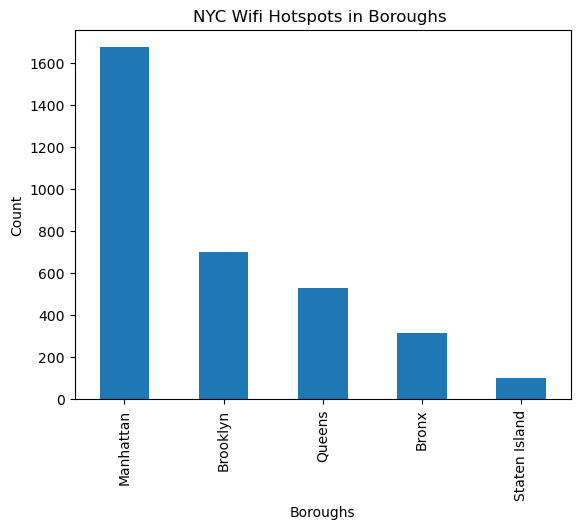

In [797]:
borough_counts.plot(kind='bar')

plt.xlabel('Boroughs')
plt.ylabel('Count')
plt.title('NYC Wifi Hotspots in Boroughs ')

### Neighborhoods

In [798]:
df_onlynycwifi.Neighborhoods.value_counts()

Midtown-Midtown South                               160
Hudson Yards-Chelsea-Flatiron-Union Square          156
Upper West Side                                     143
DUMBO-Vinegar Hill-Downtown Brooklyn-Boerum Hill    125
Turtle Bay-East Midtown                             111
                                                   ... 
Pomonok-Flushing Heights-Hillcrest                    1
Rugby-Remsen Village                                  1
Laurelton                                             1
Rosedale                                              1
Homecrest                                             1
Name: Neighborhoods, Length: 179, dtype: int64

In [1034]:
df_Neighborhoods=df_onlynycwifi.Neighborhoods.value_counts().head(20)

Text(0.5, 1.0, 'Top 20 Neighborhoods for Wifi Hotspot')

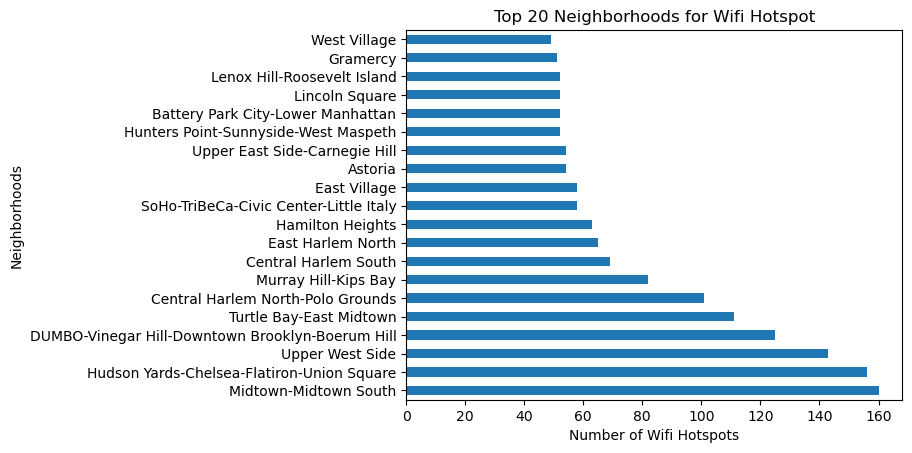

In [1035]:
df_Neighborhoods.plot(kind='barh')

plt.xlabel('Number of Wifi Hotspots')
plt.ylabel('Neighborhoods')
plt.title('Top 20 Neighborhoods for Wifi Hotspot')

In [1038]:
df_Neighborhoodsbronx=df_onlynycwifi.Neighborhoods.value_counts().head(30)

Text(0.5, 1.0, 'Top 30 Neighborhoods for Wifi Hotspot')

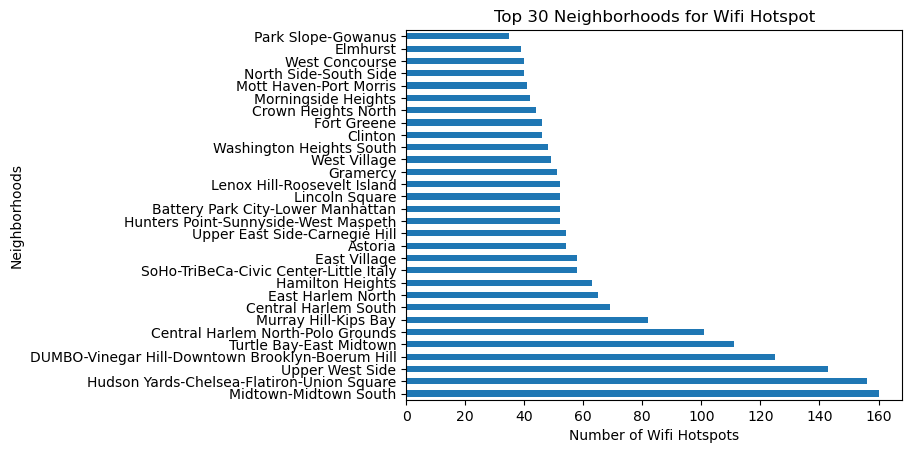

In [1040]:
df_Neighborhoodsbronx.plot(kind='barh')

plt.xlabel('Number of Wifi Hotspots')
plt.ylabel('Neighborhoods')
plt.title('Top 30 Neighborhoods for Wifi Hotspot')

In [ ]:
#Mott Haven in the Bronx is 26th 

In [864]:
df_Neighborhoodstail=df_onlynycwifi.Neighborhoods.value_counts().tail(25)

Text(0.5, 1.0, 'Bottom 25 Neighborhoods for Wifi Hotspot')

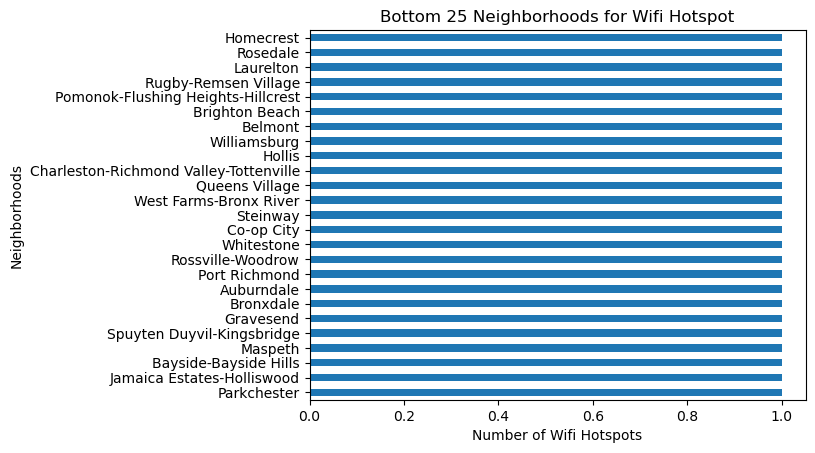

In [866]:
df_Neighborhoodstail.plot(kind='barh')

plt.xlabel('Number of Wifi Hotspots')
plt.ylabel('Neighborhoods')
plt.title('Bottom 25 Neighborhoods for Wifi Hotspot')

In [883]:
df_Neighborhoodsmiddle=df_onlynycwifi.Neighborhoods.value_counts().tail(50).head(26)

Text(0.5, 1.0, 'Bottom 50-25 Neighborhoods for Wifi Hotspot')

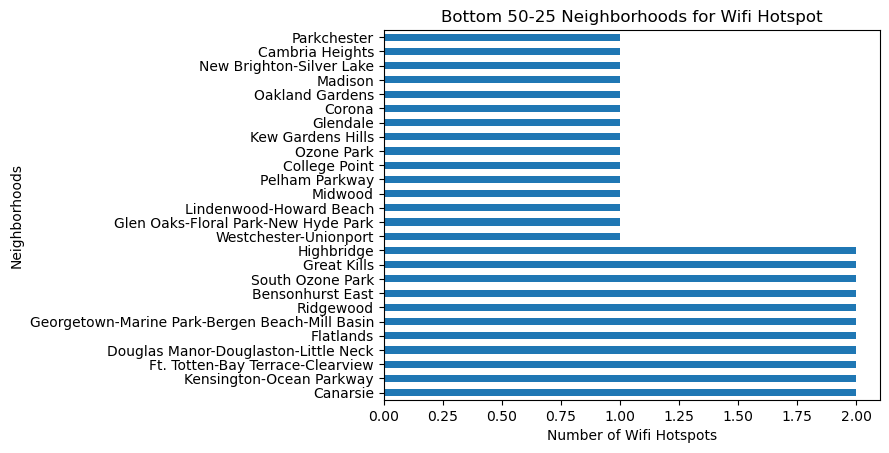

In [886]:
df_Neighborhoodsmiddle.plot(kind='barh')

plt.xlabel('Number of Wifi Hotspots')
plt.ylabel('Neighborhoods')
plt.title('Bottom 50-25 Neighborhoods for Wifi Hotspot')

## Zip Codes

In [841]:
df_onlynycwifi.Postcode.value_counts()

11201    156
10011    110
10025    106
10016     96
10027     89
        ... 
10308      1
11422      1
10282      1
11417      1
10474      1
Name: Postcode, Length: 172, dtype: int64

In [1023]:
df_onlynycwifi.Postcode.value_counts().head(20)

11201    156
10011    110
10025    106
10016     96
10027     89
10022     86
10019     83
10003     82
11101     70
10001     65
10024     64
10023     64
10031     62
10004     51
10010     50
10065     49
10017     47
10451     47
11373     45
10457     42
Name: Postcode, dtype: int64

In [1020]:
df_Postcode=df_onlynycwifi.Postcode.value_counts().head(20)

Text(0.5, 1.0, 'Top 20 Zip Codes with Wifi Hotspot')

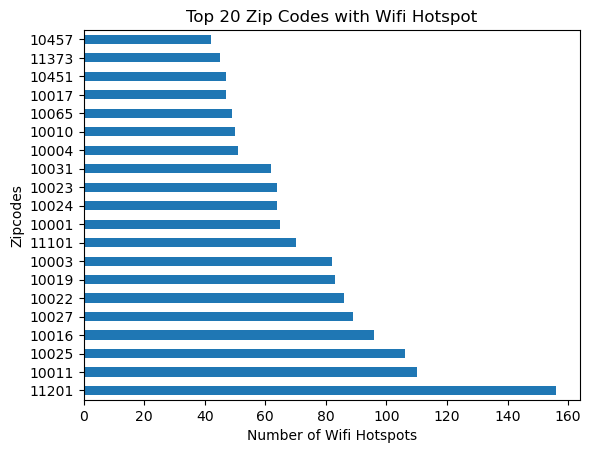

In [1021]:
df_Postcode.plot(kind='barh')

plt.xlabel('Number of Wifi Hotspots')
plt.ylabel('Zipcodes')
plt.title('Top 20 Zip Codes with Wifi Hotspot')

In [854]:
df_Postcodelast20=df_onlynycwifi.Postcode.value_counts().tail(30)

Text(0.5, 1.0, 'Bottom 20 Zip Codes with Wifi Hotspot')

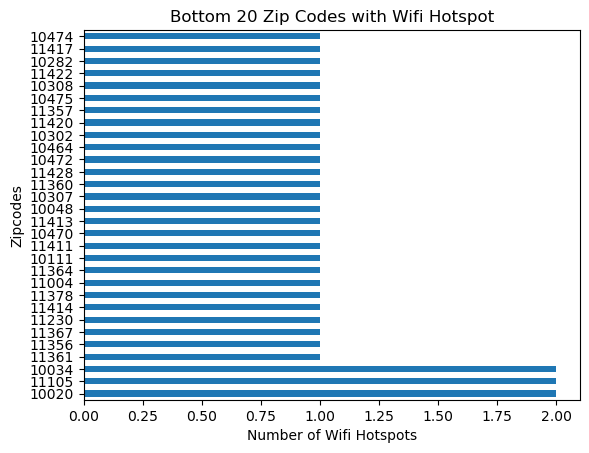

In [855]:
df_Postcodelast20.plot(kind='barh')

plt.xlabel('Number of Wifi Hotspots')
plt.ylabel('Zipcodes')
plt.title('Bottom 20 Zip Codes with Wifi Hotspot')

### Locations

In [801]:
df_onlynycwifi.Location_T.value_counts()

Outdoor Kiosk                                   1867
Outdoor                                          699
Subway Station                                   276
Library                                          214
Indoor                                           126
Outdoor TWC Aerial                               121
Indoor AP - North Maintenance Area                 3
Indoor AP - South Maintenance Area                 3
Indoor AP - North Management Office                2
Indoor AP - South Management Office                2
Indoor AP - Community Center - Gym                 1
Indoor AP - Community Center - Activity Rm 2       1
Indoor AP - Community Center - Activity Rm 1       1
Indoor AP - Community Center - Computer Rm         1
Indoor AP - Queens Public Library                  1
Indoor AP - Community Center - Cafeteria           1
Name: Location_T, dtype: int64

In [802]:
df_onlynycwifi.Location_T.value_counts(normalize=True).mul(100).round(2).astype(str) + '%'

Outdoor Kiosk                                   56.25%
Outdoor                                         21.06%
Subway Station                                   8.32%
Library                                          6.45%
Indoor                                            3.8%
Outdoor TWC Aerial                               3.65%
Indoor AP - North Maintenance Area               0.09%
Indoor AP - South Maintenance Area               0.09%
Indoor AP - North Management Office              0.06%
Indoor AP - South Management Office              0.06%
Indoor AP - Community Center - Gym               0.03%
Indoor AP - Community Center - Activity Rm 2     0.03%
Indoor AP - Community Center - Activity Rm 1     0.03%
Indoor AP - Community Center - Computer Rm       0.03%
Indoor AP - Queens Public Library                0.03%
Indoor AP - Community Center - Cafeteria         0.03%
Name: Location_T, dtype: object

### NYC Wifi Hotspots are ... 
   #### Outdoor 81% 
   #### Subway 8.3 %
   #### Libray 6.4 %
   #### Indoor 4 %

## Wifi Service

### Types of Service (Free or Limited Free)

In [803]:
df_onlynycwifi.Type.value_counts()

Free            2736
Limited Free     581
Partner Site       2
Name: Type, dtype: int64

In [804]:
df_onlynycwifi.Type.value_counts(normalize=True).mul(100).round(2).astype(str) + '%'

Free            82.43%
Limited Free    17.51%
Partner Site     0.06%
Name: Type, dtype: object

In [805]:
df_servicetype=df_onlynycwifi.Type.value_counts()

Text(0.5, 1.0, 'Type of Wifi in NYC')

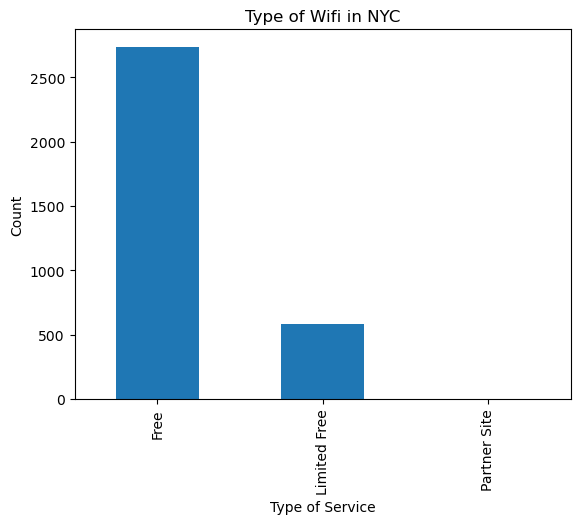

In [806]:
df_servicetype.plot(kind='bar')

plt.xlabel('Type of Service')
plt.ylabel('Count')
plt.title('Type of Wifi in NYC')

### Service Providers Names 

In [807]:
df_onlynycwifi.Provider.value_counts()

LinkNYC - Citybridge       1868
SPECTRUM                    343
Transit Wireless            276
ALTICEUSA                   237
Harlem                      101
Downtown Brooklyn           100
NYPL                         90
QPL                          65
BPL                          59
Manhattan Down Alliance      36
Chelsea                      30
Fiberless                    30
NYCHA                        28
AT&T                         27
Spot On Networks             16
City Tech                    11
Partner                       2
Name: Provider, dtype: int64

In [808]:
df_onlynycwifi.Provider.value_counts(normalize=True).mul(100).round(2).astype(str) + '%'

LinkNYC - Citybridge       56.28%
SPECTRUM                   10.33%
Transit Wireless            8.32%
ALTICEUSA                   7.14%
Harlem                      3.04%
Downtown Brooklyn           3.01%
NYPL                        2.71%
QPL                         1.96%
BPL                         1.78%
Manhattan Down Alliance     1.08%
Chelsea                      0.9%
Fiberless                    0.9%
NYCHA                       0.84%
AT&T                        0.81%
Spot On Networks            0.48%
City Tech                   0.33%
Partner                     0.06%
Name: Provider, dtype: object

Text(0.5, 1.0, 'NYC Wifi Service Providers')

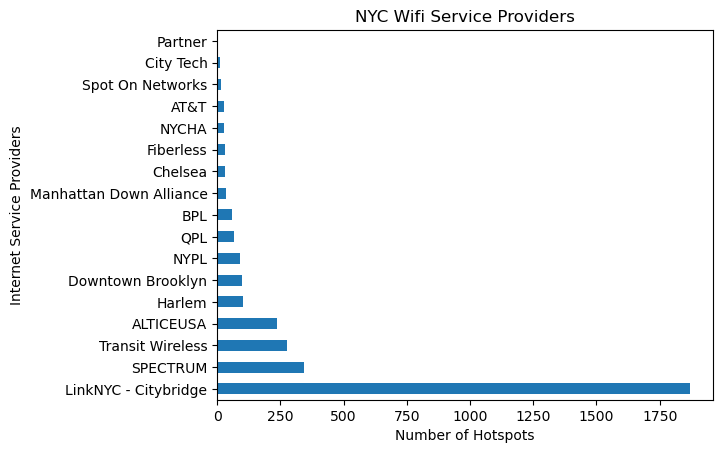

In [809]:
df_onlynycwifi.Provider.value_counts().plot(kind='barh')

plt.xlabel('Number of Hotspots')
plt.ylabel('Internet Service Providers')
plt.title('NYC Wifi Service Providers')


### Wireless Networks Names

In [810]:
df_onlynycwifi.SSID.value_counts().head(10)

LinkNYC Free Wi-Fi          1868
GuestWiFi                    580
TransitWirelessWiFi          276
Harlem Wi-Fi                 101
Downtown Brooklyn WiFi       100
NYPL                          90
QBPL_WIRELESS                 65
BPLUNWIRED                    59
DowntownBrooklynWiFi_Fon      39
#DwtwnAllianceFreeWiFi        36
Name: SSID, dtype: int64

In [811]:
df_onlynycwifi.SSID.value_counts(normalize=True).mul(100).round(2).astype(str) + '%'

LinkNYC Free Wi-Fi          56.28%
GuestWiFi                   17.48%
TransitWirelessWiFi          8.32%
Harlem Wi-Fi                 3.04%
Downtown Brooklyn WiFi       3.01%
NYPL                         2.71%
QBPL_WIRELESS                1.96%
BPLUNWIRED                   1.78%
DowntownBrooklynWiFi_Fon     1.18%
#DwtwnAllianceFreeWiFi       1.08%
Governors Island              0.9%
CICFreeWiFi                   0.9%
attwifi                      0.81%
Quensbridge Connected        0.48%
unionsquarewifi              0.03%
BryantPark.org               0.03%
Name: SSID, dtype: object

Text(0.5, 1.0, 'Top 10 Networks')

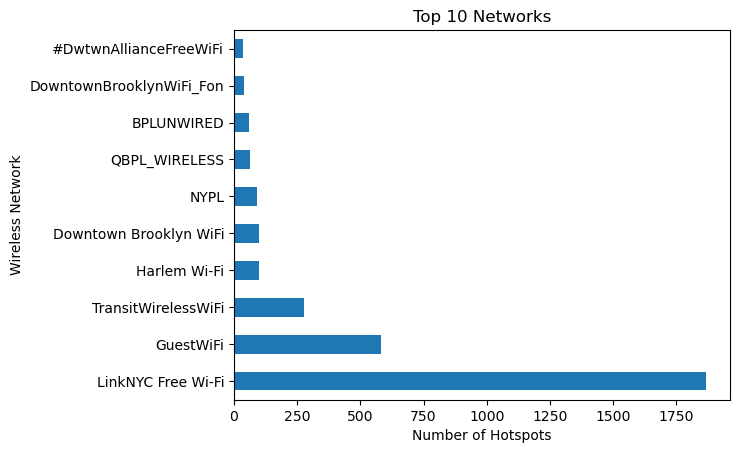

In [812]:
df_ssid=df_onlynycwifi.SSID.value_counts().head(10)
df_ssid.plot(kind='barh')

plt.xlabel('Number of Hotspots')
plt.ylabel('Wireless Network')
plt.title('Top 10 Networks')

### LinkNYC Free Wi-Fi          56.28%
### GuestWiFi                   17.48%
### TransitWirelessWiFi          8.32%
### Harlem Wi-Fi                 3.04%
### Downtown Brooklyn WiFi       3.01%
### NYPL                         2.71%
### QBPL_WIRELESS                1.96%
### BPLUNWIRED                   1.78%
### DowntownBrooklynWiFi_Fon     1.18%
### DwtwnAllianceFreeWiFi       1.08%

### Remarks 

In [813]:
df_onlynycwifi.Remarks.value_counts()

Tablet Internet -phone , Free 1 GB Wi-FI Service    1868
3 free 10 min sessions                               580
Free - up to 5 mbs                                    30
Free - Up to 25 mbs Wi-Fi Service                     16
SN 14                                                  1
                                                    ... 
SN 277                                                 1
SN 259                                                 1
SN 189                                                 1
SN 475                                                 1
SN 409                                                 1
Name: Remarks, Length: 281, dtype: int64

In [814]:
df_Remarks=df_onlynycwifi.Remarks.value_counts().head(5)

Text(0.5, 1.0, 'Top 5 Remarks')

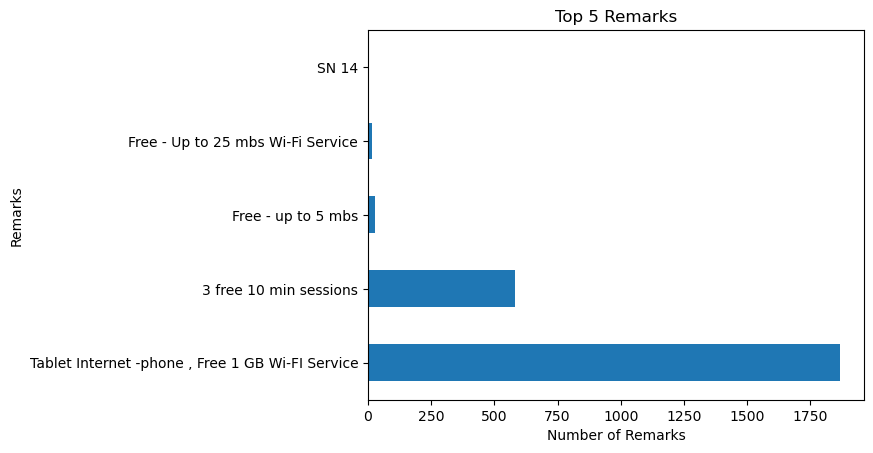

In [815]:
df_Remarks.plot(kind='barh')

plt.xlabel('Number of Remarks')
plt.ylabel('Remarks')
plt.title('Top 5 Remarks')

### Council Districts

In [816]:
df_onlynycwifi.Council_Districttop15 = df_onlynycwifi.Council_District.value_counts().head(15) 

C:\Users\reoco\AppData\Local\Temp\ipykernel_12768\317374167.py:1: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  df_onlynycwifi.Council_Districttop15 = df_onlynycwifi.Council_District.value_counts().head(15)


In [817]:
df_onlynycwifi.Council_Districtper = df_onlynycwifi.Council_District.value_counts(normalize=True).mul(100).round(2).astype(str).head(15) + '%'

C:\Users\reoco\AppData\Local\Temp\ipykernel_12768\4195886558.py:1: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  df_onlynycwifi.Council_Districtper = df_onlynycwifi.Council_District.value_counts(normalize=True).mul(100).round(2).astype(str).head(15) + '%'


In [818]:
df_onlynycwifi.Council_Districtper

3     8.98%
4     8.29%
9     6.48%
2     6.12%
33     5.6%
1     5.24%
6     5.18%
7     4.79%
8     3.71%
26    3.28%
35    3.07%
17    2.11%
5     2.05%
39     1.9%
29    1.78%
Name: Council_District, dtype: object

In [819]:
df_onlynycwifi.Council_Districttop15

3     298
4     275
9     215
2     203
33    186
1     174
6     172
7     159
8     123
26    109
35    102
17     70
5      68
39     63
29     59
Name: Council_District, dtype: int64

Text(0.5, 1.0, 'Top 15 City Council Districts')

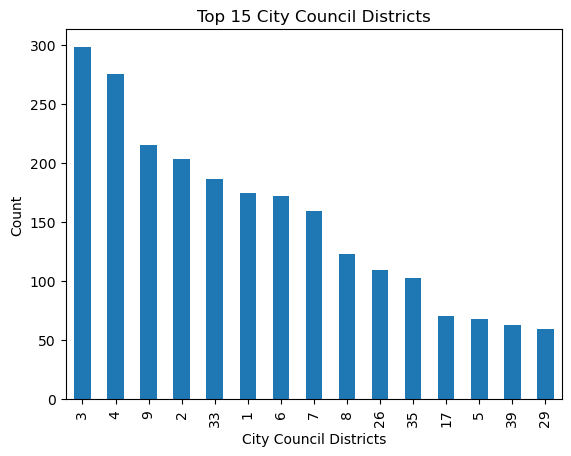

In [820]:
df_onlynycwifi.Council_Districttop15.plot(kind='bar')

plt.xlabel('City Council Districts')
plt.ylabel('Count')
plt.title('Top 15 City Council Districts')


In [1031]:
df_Neighborhoodcouncilcompare = df_onlynycwificompare.groupby(['Borough_Name','Council_District','Provider', 'Neighborhoods'])['Type']


In [1030]:
df_Neighborhoodcouncilcompare.describe()

count  \
Borough_Name  Council_District Provider                Neighborhoods                                              
Bronx         8                ALTICEUSA               Longwood                                               1   
                                                       Mott Haven-Port Morris                                 7   
                                                       West Concourse                                        13   
                               AT&T                    West Concourse                                         1   
                               LinkNYC - Citybridge    Melrose South-Mott Haven North                         1   
                                                       Mott Haven-Port Morris                                26   
                                                       West Concourse                                        11   
                               NYPL                    Mott Haven-Port Morris                                 1   
                               Transit Wireless        Longwood                                               2   
                                                       Mott Haven-Port Morris                                 5   
                                                       West Concourse                                         1   
              11               ALTICEUSA               Norwood                                                9   
                                                       Van Cortlandt Village                                  1   
                                                       park-cemetery-etc-Bronx                                2   
                               NYPL                    North Riverdale-Fieldston-Riverdale                    2   
                                                       Norwood                                                1   
                                                       Spuyten Duyvil-Kingsbridge                             1   
                                                       Van Cortlandt Village                                  1   
                                                       Woodlawn-Wakefield                                     1   
                               Transit Wireless        Bedford Park-Fordham North                             1   
                                                       Norwood                                                1   
              12               ALTICEUSA               Eastchester-Edenwald-Baychester                        8   
                                                       Williamsbridge-Olinville                               2   
                                                       Woodlawn-Wakefield                                     1   
                               NYPL                    Co-op City                                             1   
                                                       Eastchester-Edenwald-Baychester                        1   
                                                       Williamsbridge-Olinville                               1   
                                                       Woodlawn-Wakefield                                     1   
              13               ALTICEUSA               Pelham Bay-Country Club-City Island                    6   
                                                       Schuylerville-Throgs Neck-Edgewater Park               8   
                                                       Soundview-Castle Hill-Clason Point-Harding Park        2   
                                                       Van Nest-Morris Park-Westchester Square                5   
                                                       park-cemetery-etc-Bronx                                5   
                               NYPL                    Bronxdale                 

# df_Neighborhoodcouncilcompare.value_counts()

In [988]:
# df_Neighborhoodcouncilcompare.plot(kind='bar') #no numeric data to plot

### Are there Relationships ???

In [821]:
df_onlynycwifi

,Borough,Type,Provider,Name,Location,Latitude,Longitude,Location_T,Remarks,City,...,SourceID,Activated,Borough_Name,Neighborhood Tabulation Area Code (NTACODE),Neighborhoods,Council_District,Postcode,BoroCD,"Location (Lat, Long)",Community_Districts
0,4,Limited Free,SPECTRUM,Baisley Pond Park,Park Perimeter,40.674860,-73.784120,Outdoor TWC Aerial,3 free 10 min sessions,Queens,...,0,09/09/9999,Queens,QN02,Springfield Gardens North,28,11434,412,"(40.6748599999, -73.7841200005)",41.0
1,4,Limited Free,SPECTRUM,Kissena Park,Park Perimeter,40.747560,-73.818150,Outdoor TWC Aerial,3 free 10 min sessions,Queens,...,0,09/09/9999,Queens,QN22,Flushing,20,11355,407,"(40.7475599996, -73.8181499997)",22.0
2,3,Free,Transit Wireless,Grand St (L),Grand St (L),40.711926,-73.940670,Subway Station,SN 123,Brooklyn,...,NaN,09/09/9999,Brooklyn,BK90,East Williamsburg,34,11206,301,"(40.7119259997, -73.9406699994)",36.0
3,3,Free,Downtown Brooklyn,NaN,125 Court St.,40.689985,-73.991995,Outdoor,NaN,Brooklyn,...,NaN,09/09/9999,Brooklyn,BK09,Brooklyn Heights-Cobble Hill,33,11201,302,"(40.6899850001, -73.9919950004)",68.0
4,1,Free,Transit Wireless,Lexington Av-63 St (F),Lexington Av-63 St (F),40.764630,-73.966115,Subway Station,SN 223,New York,...,NaN,09/09/9999,Manhattan,MN40,Upper East Side-Carnegie Hill,4,10065,108,"(40.7646300002, -73.9661150001)",23.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3314,3,Limited Free,SPECTRUM,Carroll Park,Court off Smith St between Carrol St and 1st P...,40.680630,-73.995382,Outdoor TWC Aerial,3 free 10 min sessions,Brooklyn,...,0,09/09/9999,Brooklyn,BK33,Carroll Gardens-Columbia Street-Red Hook,39,11231,306,"(40.6806299998, -73.9953819995)",14.0
3315,2,Free,LinkNYC - Citybridge,bx-01-138789,312 WILLIS AVENUE,40.810896,-73.921434,Outdoor Kiosk,"Tablet Internet -phone , Free 1 GB Wi-FI Service",Bronx,...,LINK-012132,04/20/2018,Bronx,BX39,Mott Haven-Port Morris,8,10454,201,"(40.8108964904, -73.9214341701)",49.0
3316,3,Free,LinkNYC - Citybridge,bk-01-143982,32 GRAHAM AVENUE,40.701930,-73.942239,Outdoor Kiosk,"Tablet Internet -phone , Free 1 GB Wi-FI Service",Brooklyn,...,LINK-000004,08/02/2017,Brooklyn,BK90,East Williamsburg,34,11206,301,"(40.7019303441, -73.9422392381)",36.0
3317,3,Free,LinkNYC - Citybridge,bk-17-126527,1339 FLATBUSH AVENUE,40.638560,-73.953603,Outdoor Kiosk,"Tablet Internet -phone , Free 1 GB Wi-FI Service",Brooklyn,...,LINK-000022,05/11/2018,Brooklyn,BK95,Erasmus,45,11226,317,"(40.6385596088, -73.9536032378)",61.0


In [822]:
df_onlynycwificompare = df_onlynycwifi[['Borough_Name', 'Neighborhoods' , 'Location', 'Postcode','Council_District', 'Type', 'Provider' , 'SSID']].copy()

In [823]:
df_onlynycwificompare

,Borough_Name,Neighborhoods,Location,Postcode,Council_District,Type,Provider,SSID
0,Queens,Springfield Gardens North,Park Perimeter,11434,28,Limited Free,SPECTRUM,GuestWiFi
1,Queens,Flushing,Park Perimeter,11355,20,Limited Free,SPECTRUM,GuestWiFi
2,Brooklyn,East Williamsburg,Grand St (L),11206,34,Free,Transit Wireless,TransitWirelessWiFi
3,Brooklyn,Brooklyn Heights-Cobble Hill,125 Court St.,11201,33,Free,Downtown Brooklyn,Downtown Brooklyn WiFi
4,Manhattan,Upper East Side-Carnegie Hill,Lexington Av-63 St (F),10065,4,Free,Transit Wireless,TransitWirelessWiFi
...,...,...,...,...,...,...,...,...
3314,Brooklyn,Carroll Gardens-Columbia Street-Red Hook,Court off Smith St between Carrol St and 1st P...,11231,39,Limited Free,SPECTRUM,GuestWiFi
3315,Bronx,Mott Haven-Port Morris,312 WILLIS AVENUE,10454,8,Free,LinkNYC - Citybridge,LinkNYC Free Wi-Fi
3316,Brooklyn,East Williamsburg,32 GRAHAM AVENUE,11206,34,Free,LinkNYC - Citybridge,LinkNYC Free Wi-Fi
3317,Brooklyn,Erasmus,1339 FLATBUSH AVENUE,11226,45,Free,LinkNYC - Citybridge,LinkNYC Free Wi-Fi


 ### Borough and Services Types 

In [824]:
df_onlynycwificompare['count'] = df_onlynycwificompare.groupby(['Borough_Name', 'Type'])['Borough_Name'].transform('count')

In [825]:
df_onlynycwificompare['count']

0        152
1        152
2        540
3        540
4       1573
        ... 
3314     160
3315     196
3316     540
3317     540
3318     540
Name: count, Length: 3319, dtype: int64

In [826]:
pivot_df_wificompare = df_onlynycwificompare.pivot_table(
    index='Borough_Name',
    columns='Type',
    values='count',
    aggfunc='mean'
)


In [827]:
pivot_df_wificompare

Type,Free,Limited Free,Partner Site
Borough_Name,,,
Bronx,196.0,120.0,NaN
Brooklyn,540.0,160.0,NaN
Manhattan,1573.0,97.0,2.0
Queens,379.0,152.0,NaN
Staten Island,48.0,52.0,NaN


Text(0.5, 1.0, 'NYC Wifi Hotspots: Type of Service in Boroughs ')

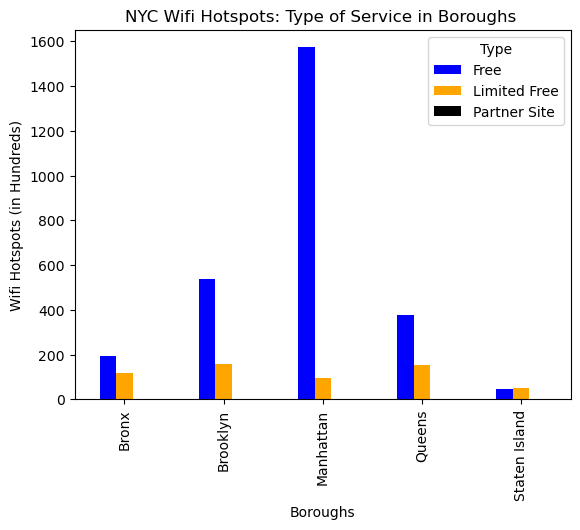

In [828]:
pivot_df_wificompare.plot(kind='bar',color=['blue', 'orange', 'black'])
plt.xlabel('Boroughs')
plt.ylabel('Wifi Hotspots (in Hundreds)')
plt.title('NYC Wifi Hotspots: Type of Service in Boroughs ')

Text(0.5, 1.0, 'NYC Wifi Hotspots: Type of Service in Boroughs ')

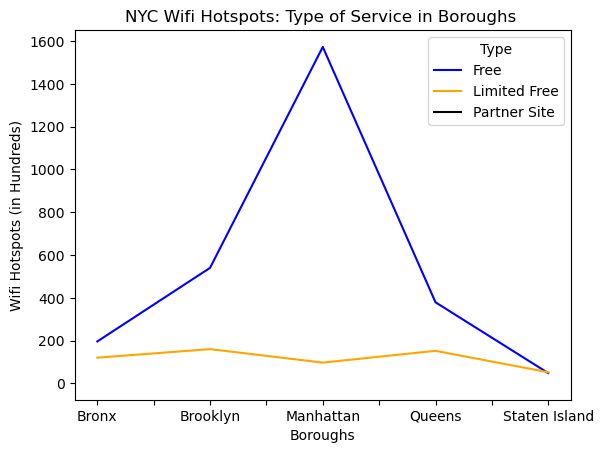

In [829]:
pivot_df_wificompare.plot(kind='line', color=['blue', 'orange', 'black'])
plt.xlabel('Boroughs')
plt.ylabel('Wifi Hotspots (in Hundreds)')
plt.title('NYC Wifi Hotspots: Type of Service in Boroughs ')

In [830]:
pivot_df_wificompare

Type,Free,Limited Free,Partner Site
Borough_Name,,,
Bronx,196.0,120.0,NaN
Brooklyn,540.0,160.0,NaN
Manhattan,1573.0,97.0,2.0
Queens,379.0,152.0,NaN
Staten Island,48.0,52.0,NaN


Text(0.5, 1.0, 'Wifi Types per Borough ')

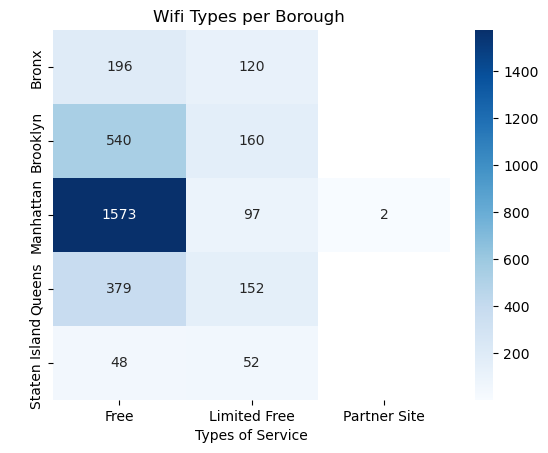

In [831]:
sns.heatmap(pivot_df_wificompare, cmap='Blues', annot=True, fmt='.0f')
plt.xlabel('Types of Service')
plt.ylabel(' ')
plt.title('Wifi Types per Borough ')

 ### Borough and Services Providers

In [832]:
df_boroughprovidercompare['count'] = df_onlynycwificompare.groupby(['Provider', 'Type'])['Borough_Name'].transform('count')

In [833]:
df_boroughprovidercompare

,0,count
0,Provider,343
1,Borough_Name,343
2,Type,276


In [834]:
pivot_df_BT = df_onlynycwificompare.pivot_table(
    index= ['Provider'],
    columns='Type',
    values='count',
    aggfunc='mean'
)

In [835]:
pivot_df_BT.count()

Type
Free            14
Limited Free     3
Partner Site     1
dtype: int64

In [836]:
pivot_df_BT

Type,Free,Limited Free,Partner Site
Provider,,,
ALTICEUSA,NaN,139.746835,NaN
AT&T,966.576923,152.000000,NaN
BPL,540.000000,NaN,NaN
Chelsea,1573.000000,NaN,NaN
City Tech,540.000000,NaN,NaN
Downtown Brooklyn,540.000000,NaN,NaN
Fiberless,1573.000000,NaN,NaN
Harlem,1573.000000,NaN,NaN
LinkNYC - Citybridge,1132.748394,NaN,NaN


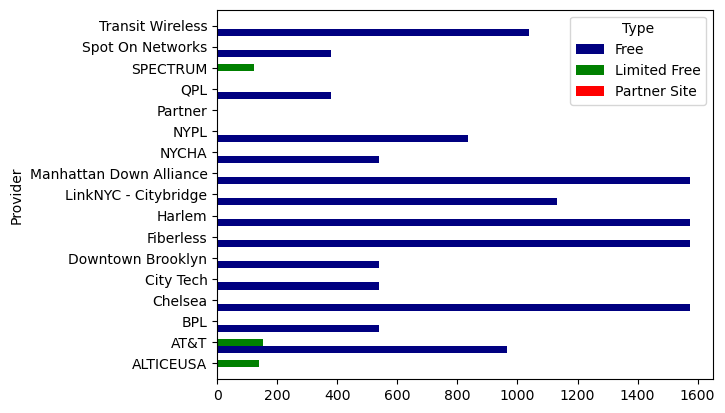

In [837]:
pivot_df_BT.plot(kind='barh',color=['navy', 'green', 'red'], width=1)
plt.show()

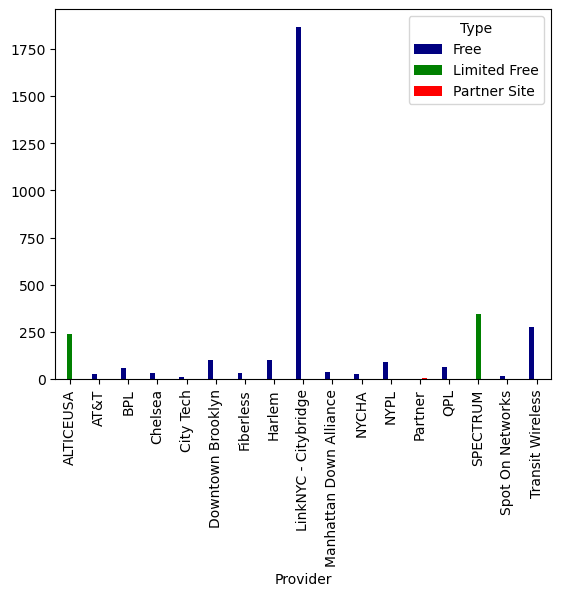

In [838]:
pivot_df_BP.plot(kind='bar',color=['navy', 'green', 'red'])
plt.show()

Text(0.5, 1.0, ' Comparing ISPs : Hotspots and Types of Service  ')

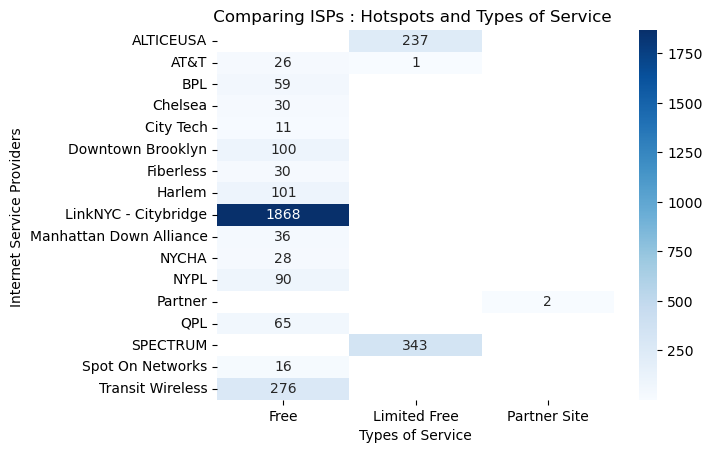

In [839]:
sns.heatmap(pivot_df_BP, cmap='Blues', annot=True, fmt='.0f')
plt.xlabel('Types of Service')
plt.ylabel('Internet Service Providers ')
plt.title(' Comparing ISPs : Hotspots and Types of Service  ')


In [ ]:
# Hotspots per Neighborhood 

In [917]:
df_Neighborhoodcompare = df_onlynycwificompare.groupby(['Borough_Name','Provider', 'Type'])['Neighborhoods']

In [918]:
df_Neighborhoodcompare.describe()

count unique  \
Borough_Name  Provider                Type                        
Bronx         ALTICEUSA               Limited Free   120     18   
              AT&T                    Free             3      3   
              LinkNYC - Citybridge    Free           137     14   
              NYPL                    Free            35     29   
              Transit Wireless        Free            21     10   
Brooklyn      ALTICEUSA               Limited Free   117     14   
              AT&T                    Free             6      5   
              BPL                     Free            59     40   
              City Tech               Free            11      1   
              Downtown Brooklyn       Free           100      3   
              LinkNYC - Citybridge    Free           257     23   
              NYCHA                   Free            28      2   
              SPECTRUM                Limited Free    43      7   
              Transit Wireless        Free            79     27   
Manhattan     AT&T                    Free            13      6   
              Chelsea                 Free            30      2   
              Fiberless               Free            30      1   
              Harlem                  Free           101      5   
              LinkNYC - Citybridge    Free          1175     25   
              Manhattan Down Alliance Free            36      2   
              NYPL                    Free            43     24   
              Partner                 Partner Site     2      2   
              SPECTRUM                Limited Free    97     15   
              Transit Wireless        Free           145     28   
Queens        AT&T                    Free             2      2   
                                      Limited Free     1      1   
              LinkNYC - Citybridge    Free           265     15   
              QPL                     Free            65     52   
              SPECTRUM                Limited Free   151     22   
              Spot On Networks        Free            16      1   
              Transit Wireless        Free            31     13   
Staten Island AT&T                    Free             2      2   
              LinkNYC - Citybridge    Free            34      5   
              NYPL                    Free            12     11   
              SPECTRUM                Limited Free    52      7   

                                                                                                 top  \
Borough_Name  Provider                Type                                                             
Bronx         ALTICEUSA               Limited Free                           park-cemetery-etc-Bronx   
              AT&T                    Free                                       Kingsbridge Heights   
              LinkNYC - Citybridge    Free                                    Mott Haven-Port Morris   
              NYPL                    Free                       North Riverdale-Fieldston-Riverdale   
              Transit Wireless        Free                                    Mott Haven-Port Morris   
Brooklyn      ALTICEUSA               Limited Free                              Seagate-Coney Island   
              AT&T                    Free                              Brooklyn Heights-Cobble Hill   
              BPL                     Free                                              Borough Park   
              City Tech               Free          DUMBO-Vinegar Hill-Downtown Brooklyn-Boerum Hill   
              Downtown Brooklyn       Free          DUMBO-Vinegar Hill-Downtown Brooklyn-Boerum Hill   
              LinkNYC - Citybridge    Free                                     North Side-South Side   
              NYCHA                   Free                                               Fort Greene   
              SPECTRUM                Limited Free          Carroll Gardens-Columbia Street-Red Hook   
           

In [ ]:
# City Council District, Neighborhoods and Hotspots 

In [933]:
df_Councilcompare = df_onlynycwificompare.groupby(['Borough_Name','Neighborhoods', 'Council_District'])['Type']

In [941]:
df_Councilcompare.describe()

count  \
Borough_Name  Neighborhoods                                      Council_District         
Bronx         Bedford Park-Fordham North                         11                   1   
                                                                 14                   7   
                                                                 15                  15   
              Belmont                                            15                   1   
              Bronxdale                                          13                   1   
...                                                                                 ...   
Staten Island Stapleton-Rosebank                                 49                   5   
              Todt Hill-Emerson Hill-Heartland Village-Lighth... 50                   3   
              West New Brighton-New Brighton-St. George          49                  18   
              Westerleigh                                        49                   7   
                                                                 50                   1   

                                                                                  unique  \
Borough_Name  Neighborhoods                                      Council_District          
Bronx         Bedford Park-Fordham North                         11                    1   
                                                                 14                    2   
                                                                 15                    2   
              Belmont                                            15                    1   
              Bronxdale                                          13                    1   
...                                                                                  ...   
Staten Island Stapleton-Rosebank                                 49                    2   
              Todt Hill-Emerson Hill-Heartland Village-Lighth... 50                    1   
              West New Brighton-New Brighton-St. George          49                    2   
              Westerleigh                                        49                    2   
                                                                 50                    1   

                                                                                            top  \
Borough_Name  Neighborhoods                                      Council_District                 
Bronx         Bedford Park-Fordham North                         11                        Free   
                                                                 14                        Free   
                                                                 15                        Free   
              Belmont                                            15                        Free   
              Bronxdale                                          13                        Free   
...                                                                                         ...   
Staten Island Stapleton-Rosebank                                 49                Limited Free   
              Todt Hill-Emerson Hill-Heartland Village-Lighth... 50                        Free   
              West New Brighton-New Brighton-St. George          49                Limited Free   
              Westerleigh                                        49                Limited Free   
                                                                 50                        Free   

                                                                                  freq  
Borough_Name  Neighborhoods                                      Council_District       
Bronx         Bedford Park-Fordham North                         11                  1  
                                                                 14                  4  
                                                         

In [ ]:
# Map with Potlly

In [942]:
df_wifi

,Borough,Type,Provider,Name,Location,Latitude,Longitude,Location_T,Remarks,City,...,SourceID,Activated,Borough_Name,Neighborhood Tabulation Area Code (NTACODE),Neighborhoods,Council_District,Postcode,BoroCD,"Location (Lat, Long)",Community_Districts
0,4,Limited Free,SPECTRUM,Baisley Pond Park,Park Perimeter,40.674860,-73.784120,Outdoor TWC Aerial,3 free 10 min sessions,Queens,...,0,09/09/9999,Queens,QN02,Springfield Gardens North,28,11434,412,"(40.6748599999, -73.7841200005)",41.0
1,4,Limited Free,SPECTRUM,Kissena Park,Park Perimeter,40.747560,-73.818150,Outdoor TWC Aerial,3 free 10 min sessions,Queens,...,0,09/09/9999,Queens,QN22,Flushing,20,11355,407,"(40.7475599996, -73.8181499997)",22.0
2,3,Free,Transit Wireless,Grand St (L),Grand St (L),40.711926,-73.940670,Subway Station,SN 123,Brooklyn,...,NaN,09/09/9999,Brooklyn,BK90,East Williamsburg,34,11206,301,"(40.7119259997, -73.9406699994)",36.0
3,3,Free,Downtown Brooklyn,NaN,125 Court St.,40.689985,-73.991995,Outdoor,NaN,Brooklyn,...,NaN,09/09/9999,Brooklyn,BK09,Brooklyn Heights-Cobble Hill,33,11201,302,"(40.6899850001, -73.9919950004)",68.0
4,1,Free,Transit Wireless,Lexington Av-63 St (F),Lexington Av-63 St (F),40.764630,-73.966115,Subway Station,SN 223,New York,...,NaN,09/09/9999,Manhattan,MN40,Upper East Side-Carnegie Hill,4,10065,108,"(40.7646300002, -73.9661150001)",23.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3314,3,Limited Free,SPECTRUM,Carroll Park,Court off Smith St between Carrol St and 1st P...,40.680630,-73.995382,Outdoor TWC Aerial,3 free 10 min sessions,Brooklyn,...,0,09/09/9999,Brooklyn,BK33,Carroll Gardens-Columbia Street-Red Hook,39,11231,306,"(40.6806299998, -73.9953819995)",14.0
3315,2,Free,LinkNYC - Citybridge,bx-01-138789,312 WILLIS AVENUE,40.810896,-73.921434,Outdoor Kiosk,"Tablet Internet -phone , Free 1 GB Wi-FI Service",Bronx,...,LINK-012132,04/20/2018,Bronx,BX39,Mott Haven-Port Morris,8,10454,201,"(40.8108964904, -73.9214341701)",49.0
3316,3,Free,LinkNYC - Citybridge,bk-01-143982,32 GRAHAM AVENUE,40.701930,-73.942239,Outdoor Kiosk,"Tablet Internet -phone , Free 1 GB Wi-FI Service",Brooklyn,...,LINK-000004,08/02/2017,Brooklyn,BK90,East Williamsburg,34,11206,301,"(40.7019303441, -73.9422392381)",36.0
3317,3,Free,LinkNYC - Citybridge,bk-17-126527,1339 FLATBUSH AVENUE,40.638560,-73.953603,Outdoor Kiosk,"Tablet Internet -phone , Free 1 GB Wi-FI Service",Brooklyn,...,LINK-000022,05/11/2018,Brooklyn,BK95,Erasmus,45,11226,317,"(40.6385596088, -73.9536032378)",61.0


In [1043]:
fig = px.scatter_geo(df_wifi, lat='Latitude', lon='Longitude' )
fig.update_layout(title='Overview of Wifi Hotspots in NYC')
fig.update_geos(fitbounds= 'geojson', projection_type='winkel tripel', visible=True)

fig.show()